In [3]:
import os
from pyuvdata import UVData
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.colors as colors
import matplotlib.gridspec as gridspec
import numpy.ma as ma

In [4]:
file = 2458745
uv = UVData()
uv.read('/lustre/aoc/projects/hera/pstar/autos/'+str(file)+'_autos_sum.uvh5')

In [5]:
print(np.sort(uv.antenna_numbers))

[  0   1   2  11  12  13  14  23  24  25  26  39  84  85  86  87  89  91
 101 102 103 104 105 106 108 120 121 122 123 124 125 126]


In [6]:
freq = uv.freq_array[0]*1e-6
antnums = uv.antenna_numbers
times = np.unique(uv.time_array)

In [13]:
def allauto_waterfall_lineplot (colorbar_min, colorbar_max):
    
    for ant in uv.antenna_numbers:
        freq = uv.freq_array[0]*1e-6
        fig = plt.figure(figsize=(20,20))

        #can use gridspec instead of saying add_subplot(1,2,1) etc
        gs = gridspec.GridSpec(2, 1, height_ratios=[2,1]) 

        #creates waterfall subplot
        waterfall= plt.subplot(gs[0])

        #create time axis
        jd_ax=plt.gca()

        #there are a lot of redundancies in time_array, so to make sure that we have a list
        #of unique times to work with, we start off by making a new array... not doing this will
        #make things get messy. gave me a blank plot at first with a bunch of lines on the side
        #before i did this.
        times= np.unique(uv.time_array)

        #create the plot. uv.get_data will get data from specified antennas
        #colors.LogNorm() puts colors on log scale
        im = plt.imshow(np.abs(uv.get_data((ant,ant, uv.polarization_array[0]))),norm=colors.LogNorm(), 
                   vmin=colorbar_min, vmax=colorbar_max, aspect='auto')
        waterfall.set_title('Waterfall+Lineplot, Antenna '+str(ant))

        # get an array of frequencies in MHz
        freqs = uv.freq_array[0, :] / 1000000
        xticks = np.arange(0, len(freqs), 120)
        plt.xticks(xticks, labels =np.around(freqs[xticks],2))

        jd_ax.set_ylabel('JD Time (days)')

        #makes equally spaced ticks in increments of 100. since we are assuming time is pretty
        #continuous, this will cover all times pretty well if we go from 0 to the length 
        jd_yticks = np.arange(0,len(times),100)
        #set_yticks takes a List of y-axis tick locations. its purpose is to set tick locations
        jd_ax.set_yticks(jd_yticks)
        #this function actually determines what the tickmarks will say.
        jd_ax.set_yticklabels(np.around(times[jd_yticks],2))


        #create second axis
        lst_ax = jd_ax.twinx()
        lst_ax.set_ylabel('LST Time (hour of the day)')

        #lst_array is in radians, and we want it in *hours*.. rad*180/pi = degrees
        #one hour= 15 degrees
        lst_hours = (uv.lst_array*(180/np.pi))/(15)

        #creates array of unique lsts
        lsts= lst_hours.reshape(uv.Ntimes,uv.Nbls)
        lsts = lsts[:,0]

        #set the ticks of the lst axis to match the lst_array in hours
        lst_yticks = np.arange(0,len(lsts),100)
        lst_ax.set_yticks(lst_yticks)
        lst_ax.set_yticklabels(np.around(lsts[lst_yticks],2))

        #gives the lst_axis information about the jd_axis. stuff like the y-dimension of the data. 
        #gets the axes to line up properly. will make it so that the tick-marks lining up, and the 
        #zeroth entry of times[jd_yticks] lining up with the zeroth entry of lsts[lst_yticks]
        lst_ax.set_ylim(jd_ax.get_ylim())

        #makes it so that the second axis does not alter the structure of the figure
        jd_ax.autoscale(False)
        lst_ax.autoscale(False)

        #creates line subplot and positions it according to gs[1]
        line= plt.subplot(gs[1])

        averaged_data= np.abs(np.average(uv.get_data((1,1, uv.polarization_array[0])),0))

        plt.plot(freq,averaged_data)
        line.set_yscale('log')
        line.set_xlabel('Frequency (MHz)')
        line.set_ylabel('Power')
        #sets the range of the graph to be the same range as waterfall plot
        line.set_xlim(freq[0],freq[-1])


        #makes waterfall x ticks invisible
        plt.setp(waterfall.get_xticklabels(), visible=False)

        #brings plots together
        plt.subplots_adjust(hspace=.0)


        #pad moves colorbar farther from plot
        cbar = plt.colorbar(im, pad= 0.15, orientation = 'horizontal')
        cbar.set_label('Power -->')
        
        #plt.savefig('/lustre/aoc/projects/hera/amyers/gitrepos/monsterDetection/waterfalls/'+
        #            str(file)+'WF_LP_ant'+str(ant))
        plt.show()
        plt.close()
    return;

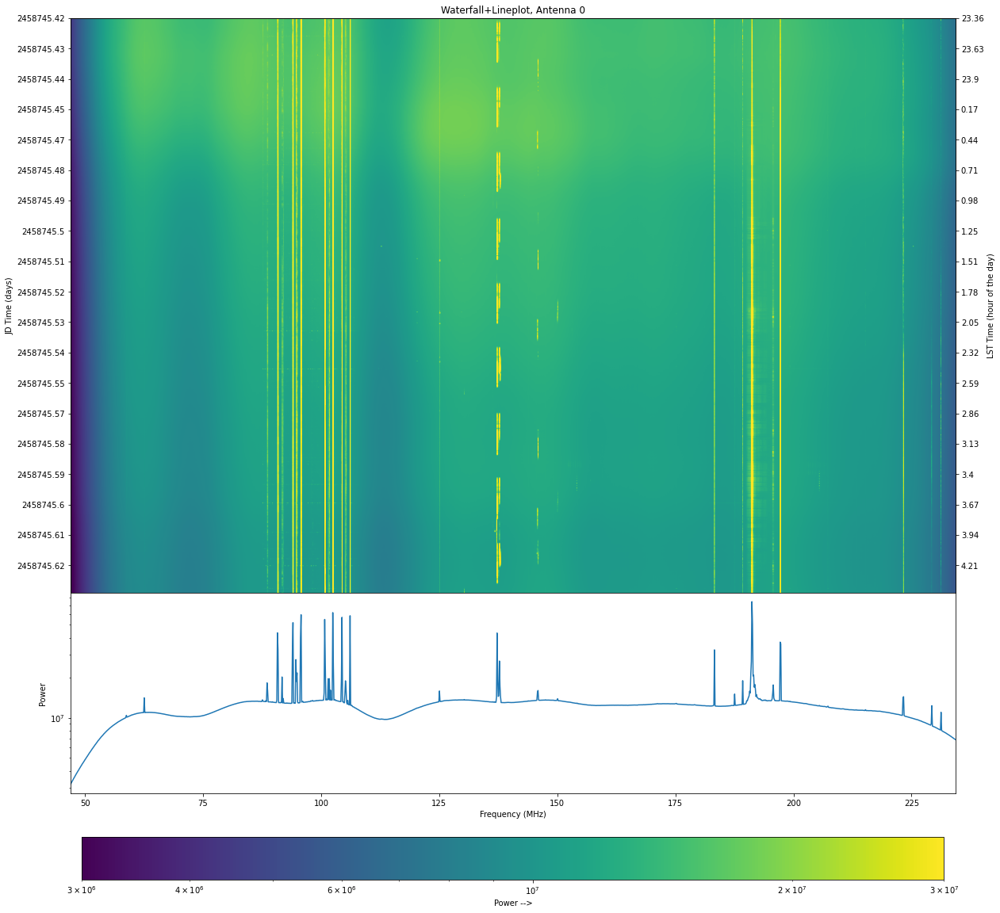

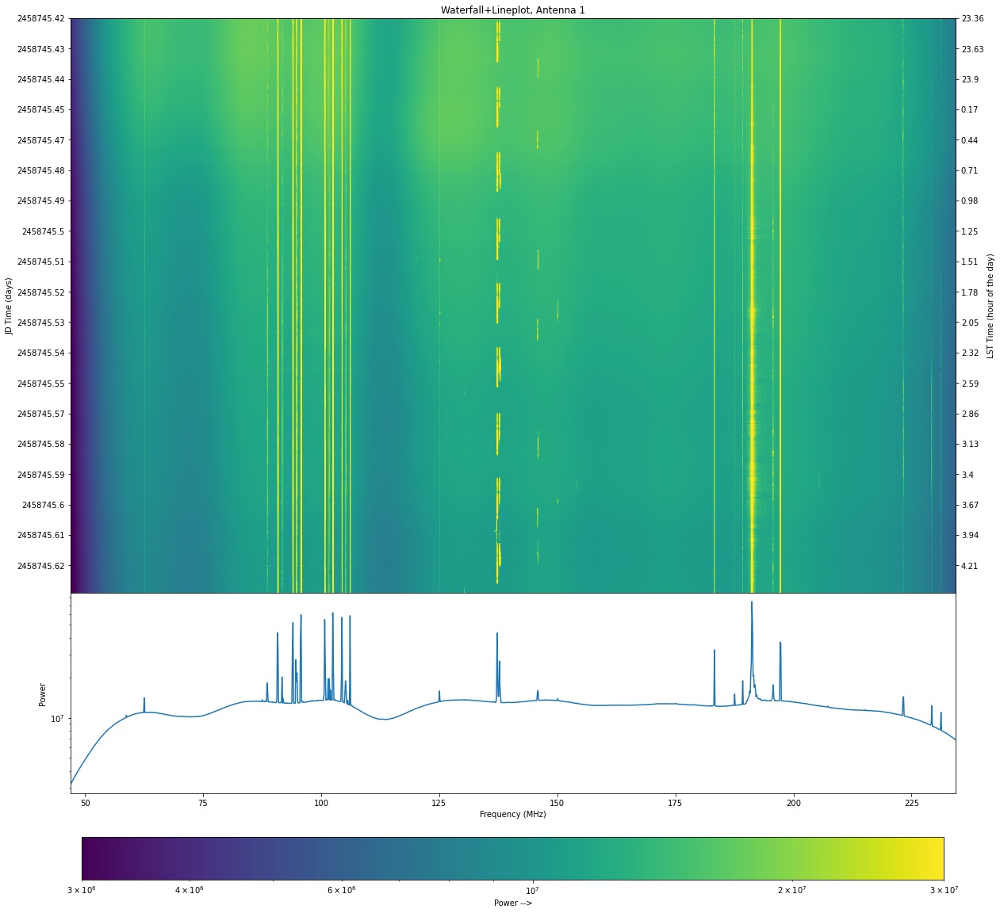

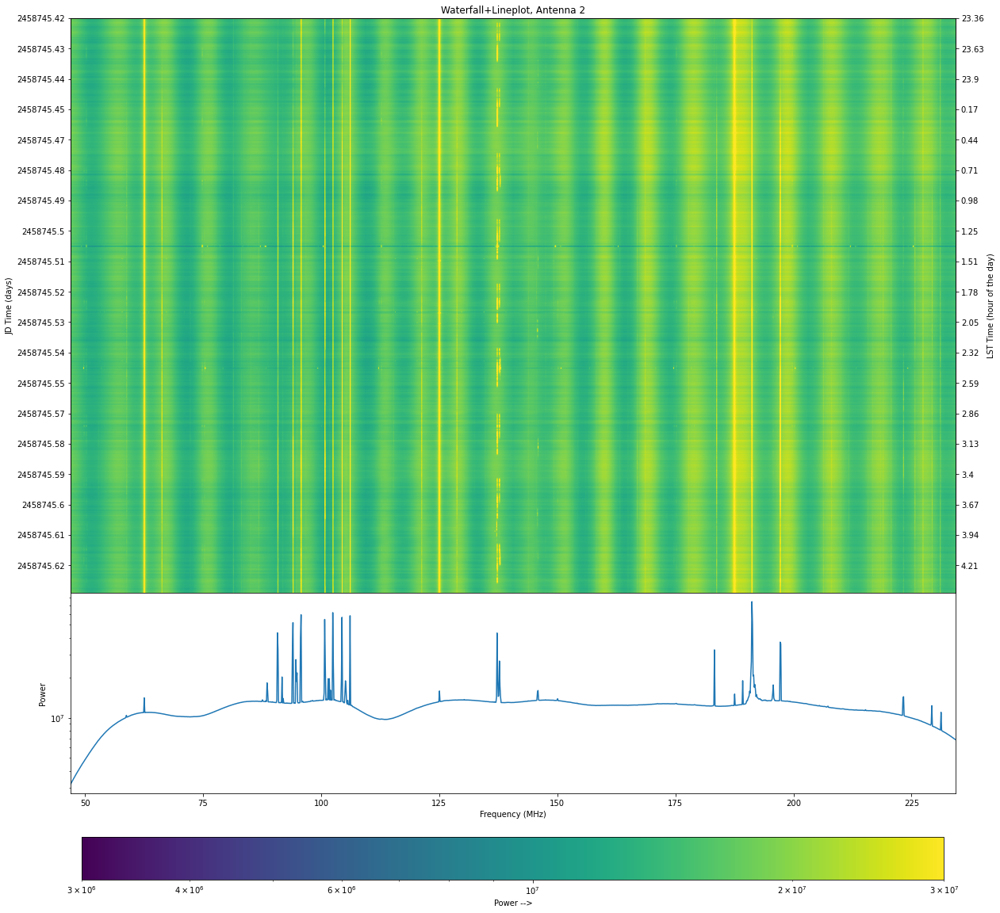

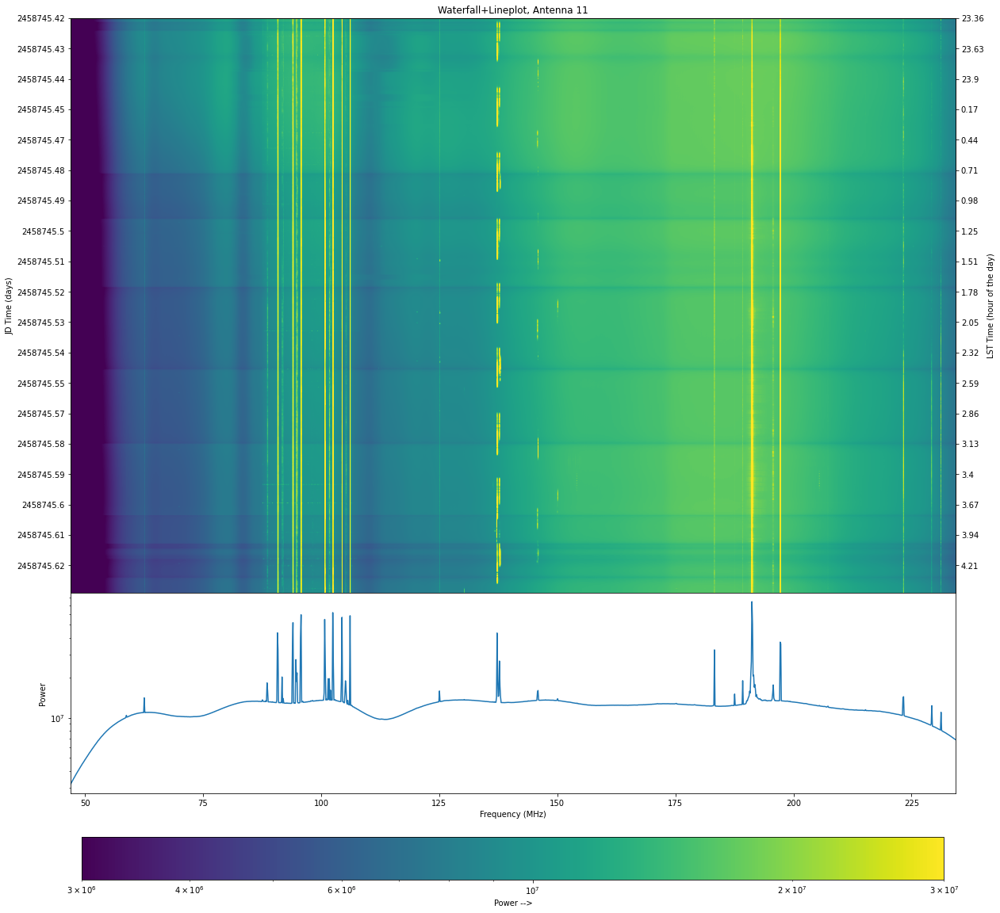

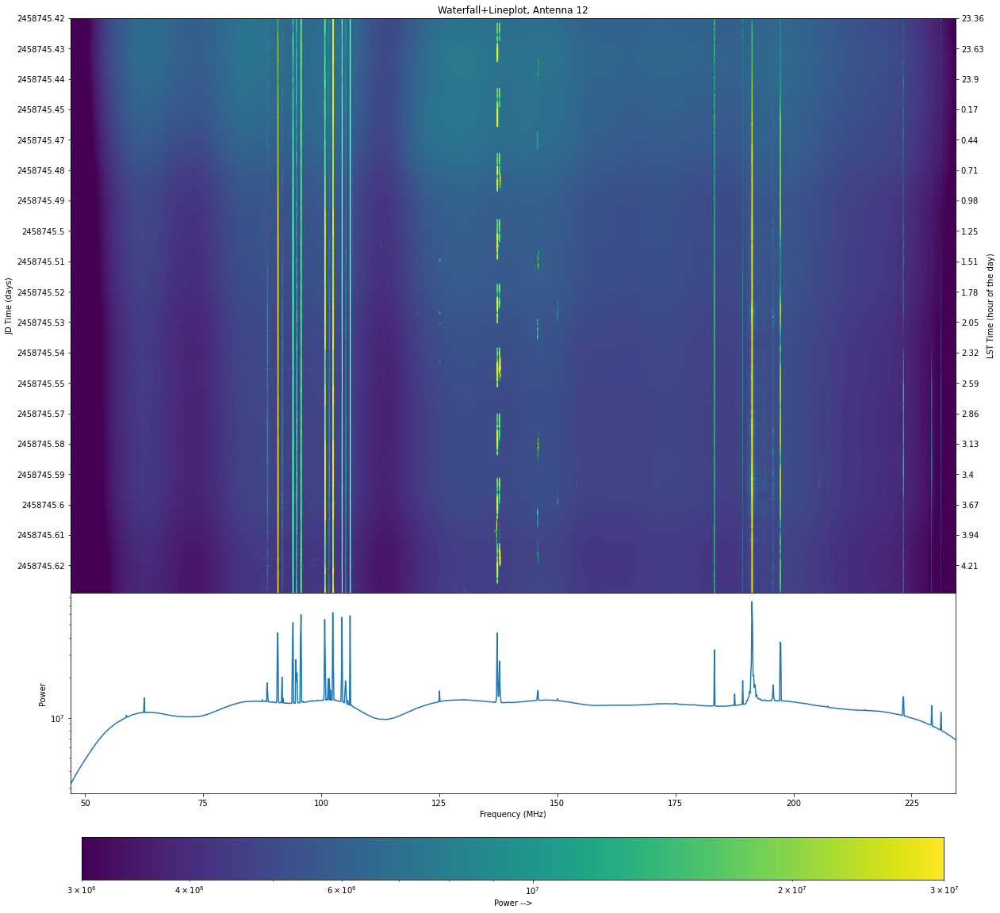

...

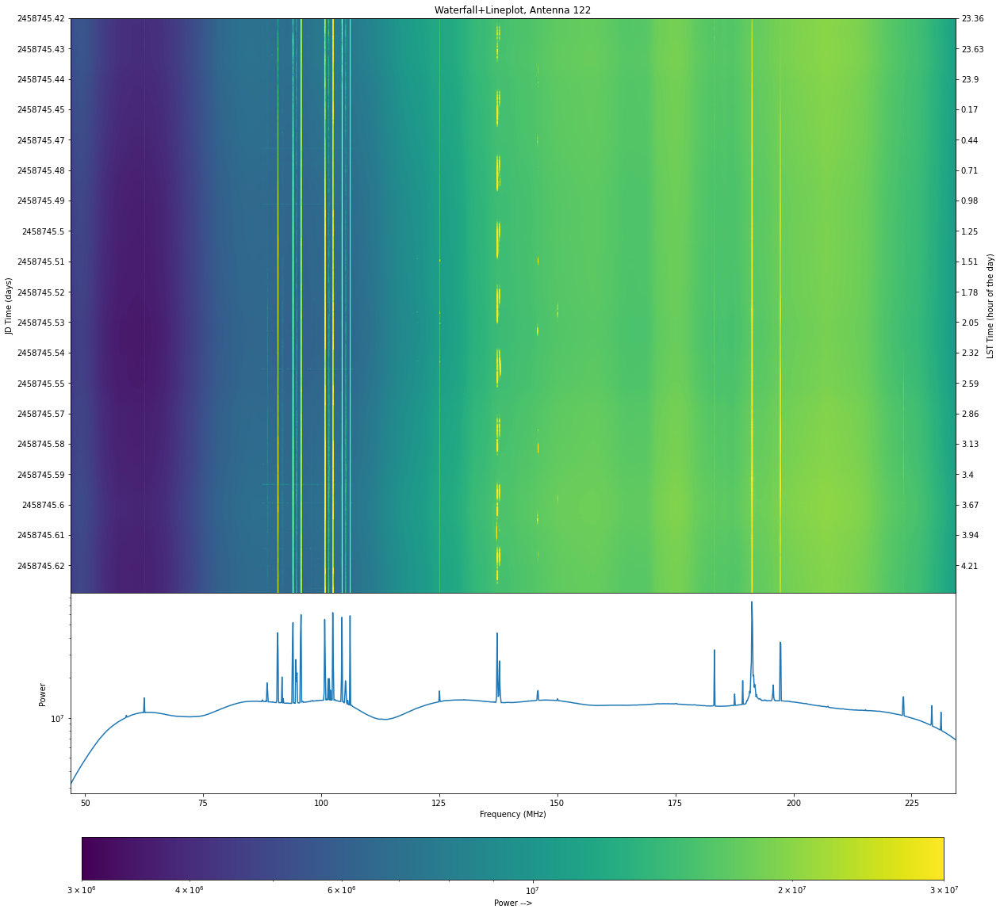

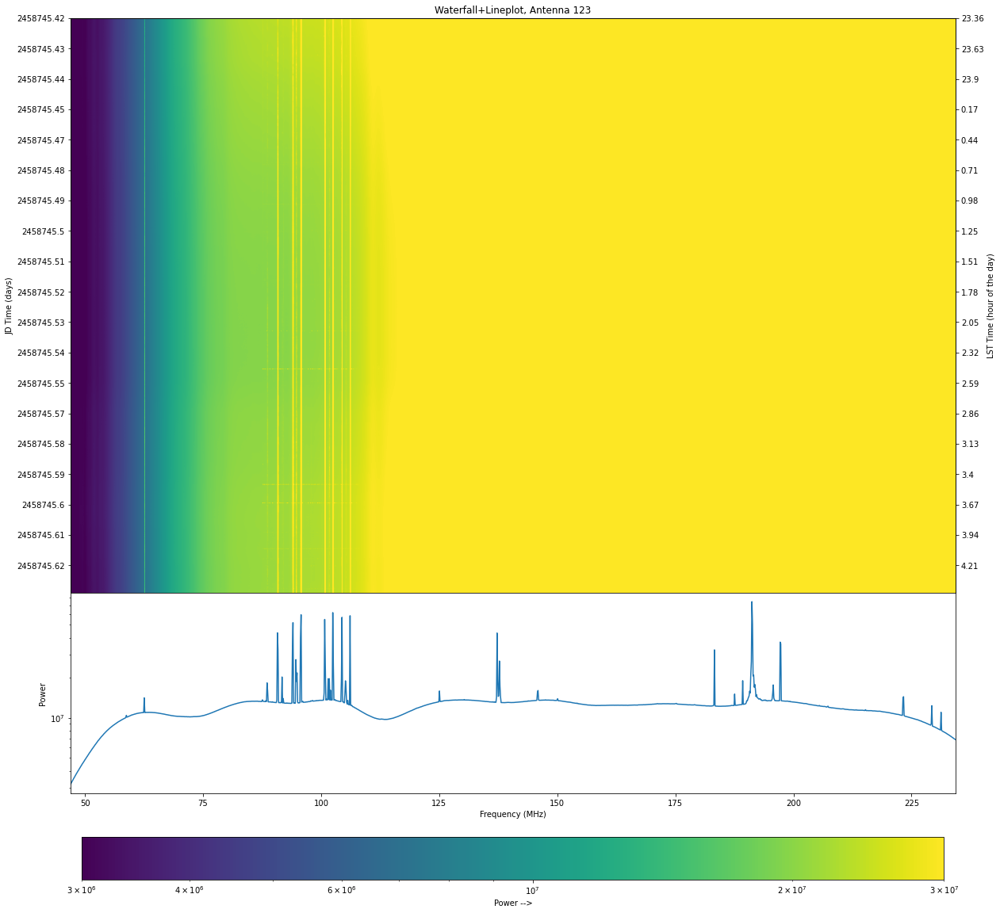

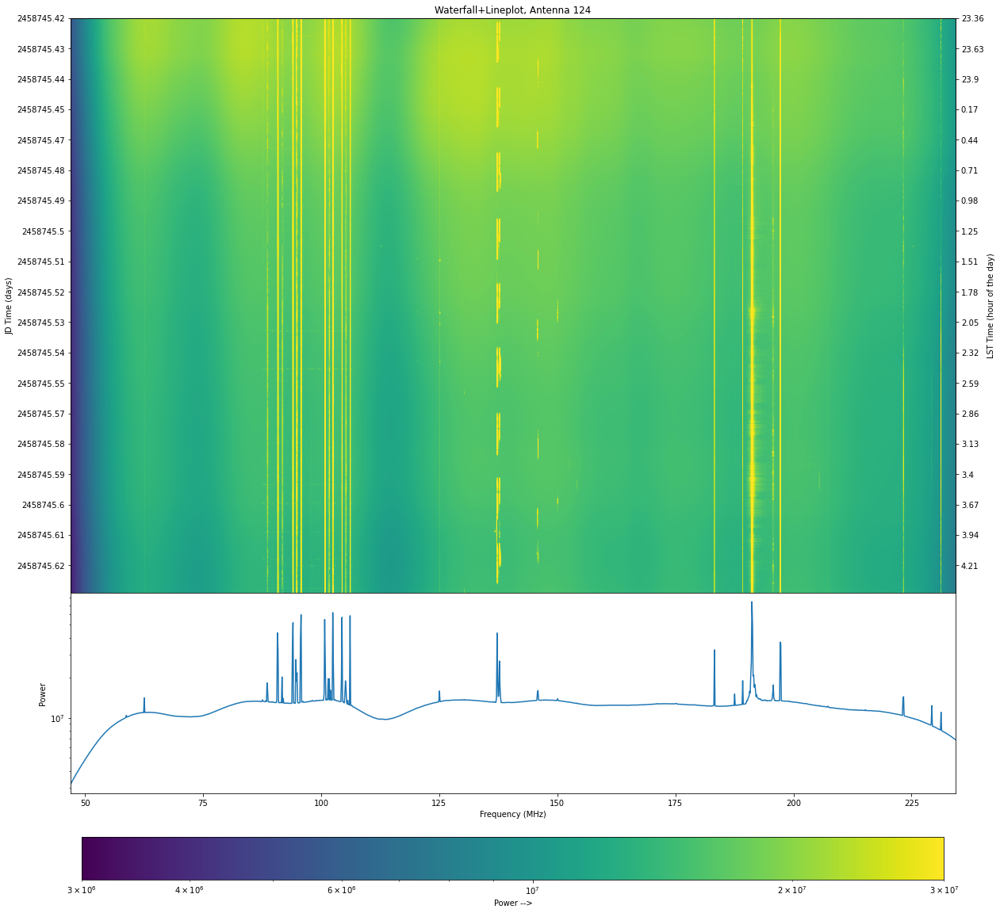

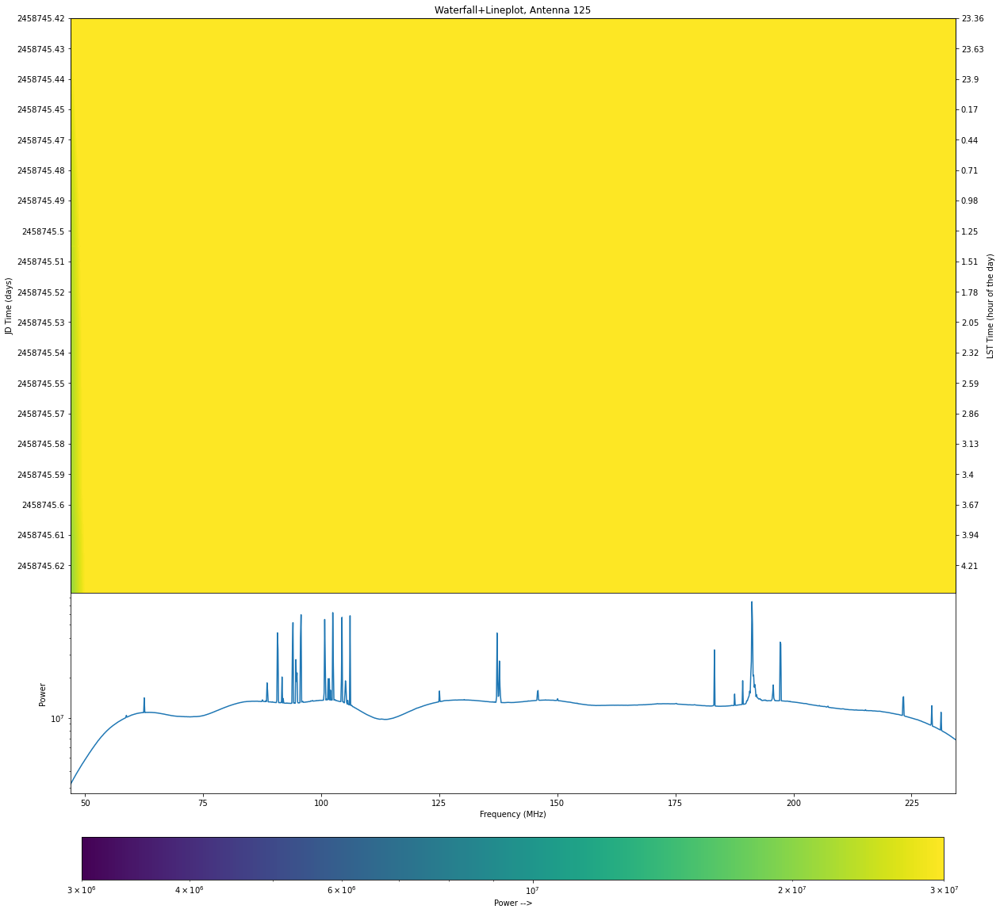

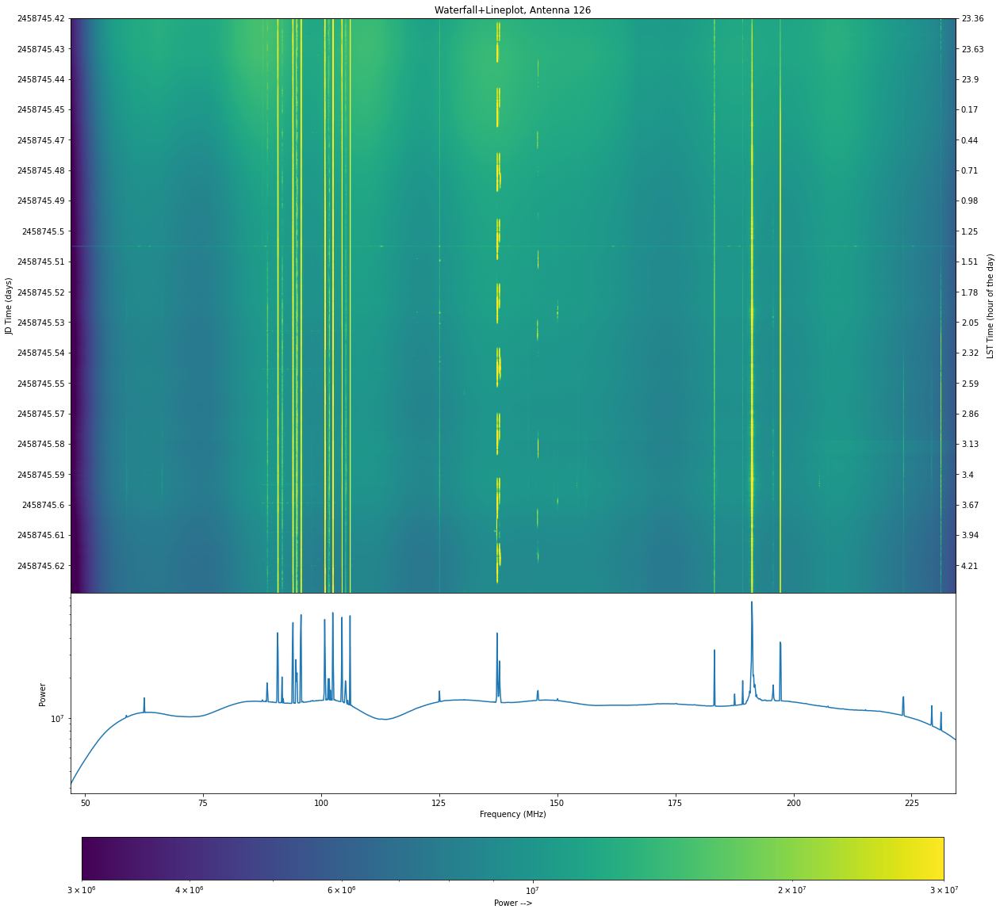

In [14]:
allauto_waterfall_lineplot(0.3*10e6, 0.3*10e7)

Text(0.5, 1.0, 'Antenna autospectra')

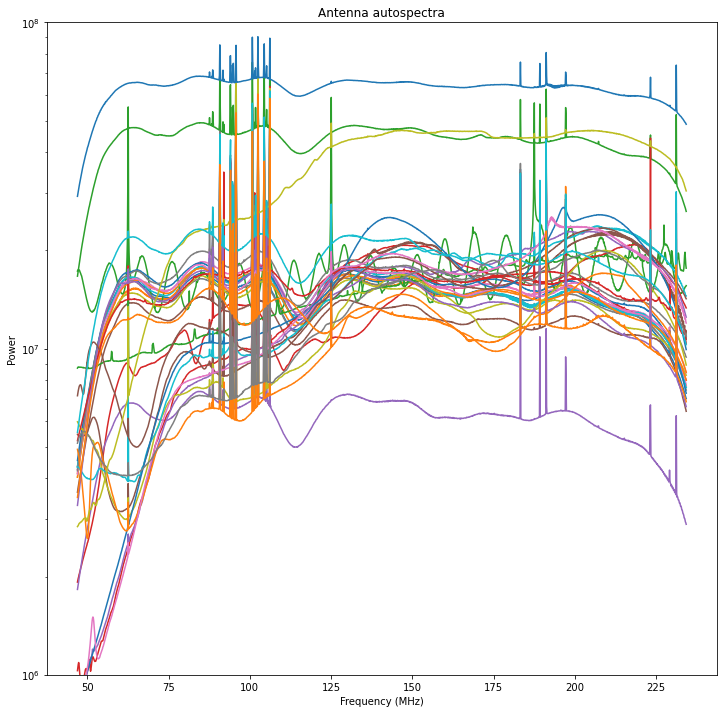

In [8]:
fig = plt.figure(figsize=(12,12))
for ant in antnums:
    dat = np.abs(uv.get_data((ant,ant,'xx'))[0])
    plt.plot(freq,dat)
plt.yscale('log')
plt.ylim((10e5,10e7))
plt.xlabel('Frequency (MHz)')
plt.ylabel('Power')
plt.title('Antenna autospectra')

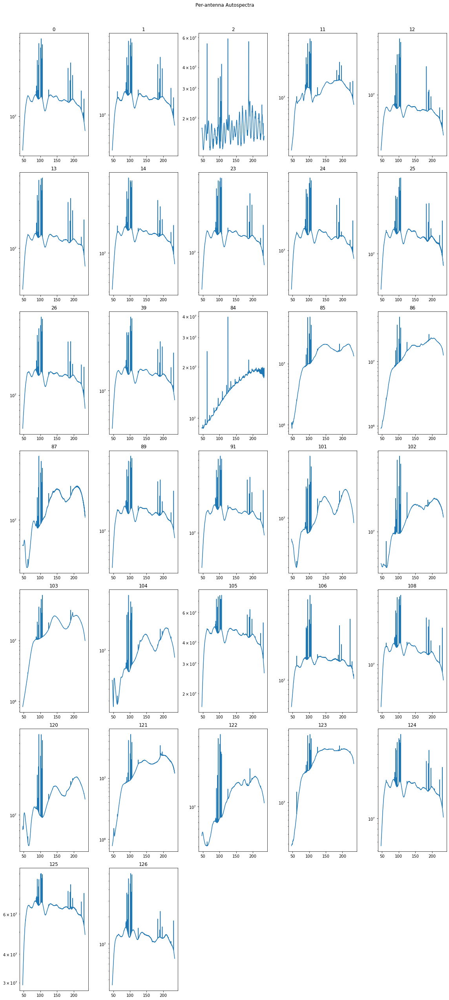

In [9]:
fig = plt.figure(figsize=(16,36))
nants = len(antnums)
Y = 5
X = nants//Y+1
for i,ant in enumerate(antnums):
    plt.subplot(X,Y,i+1)
    dat = np.abs(uv.get_data((ant,ant,'xx'))[0])
    plt.plot(freq,dat)
    plt.title(ant)
    plt.yscale('log')
plt.suptitle('Per-antenna Autospectra', y=0.98)
fig.tight_layout()
plt.subplots_adjust(top=0.95)

In [15]:
#from figure above: working antennas seem to be: 
# 0,1,13,14, 23, 25, 39,

In [48]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

hour_arrange = np.arange(times[0],times[-1],(1/24))

hour_array=[]

for hour_value in hour_arrange:
    time = find_nearest(times,hour_value)
    hour_array.append(time)


print(hour_array)
times_index = np.where(times == 2458745.6290959353)
print(times_index)
print(times_index[0])
print(int(times_index[0]))

np.abs(uv.get_data((1,1,'xx')))[0]
np.abs(uv.get_data((1,1,'xx'))[times_index])

[2458745.4207229125, 2458745.462442256, 2458745.504049752, 2458745.5457690954, 2458745.5873765913, 2458745.6290959353]
(array([1863]),)
[1863]
1863


array([[2723689., 2773349., 2824337., ..., 6153176., 6111833., 6073965.]])

In [80]:
#makes a lineplot every hour for the given antenna and loaded file
def every_hour_lineplot(ant):

    fig = plt.figure(figsize=(20,20))

    def find_nearest(array, value):
        array = np.asarray(array)
        idx = (np.abs(array - value)).argmin()
        return array[idx]

    #creating hour_array, which has times from time_array that are spaced ~ 1 hour apart 
    hour_arrange = np.arange(times[0],times[-1],(1/24))
    hour_array=[]
    for hour_value in hour_arrange:
        time = find_nearest(times,hour_value)
        hour_array.append(time)

    #setting up the structure of the subplots plots
    nhours = len(hour_array)
    cols = 3
    rows = nhours//cols +1
    i = 1

    #creating the plots
    for time in hour_array:

        plt.subplot(rows,cols,i)

        times_index = np.where(times == time)
        #np.where outputs a tuple. [0] pulls out a single number array, int makes it a number
        #which is not in an array
        times_index = int(times_index[0])

        dat = np.abs(uv.get_data((ant,ant,'xx'))[times_index])

        plt.plot(freq,dat)
        plt.title('Ant '+str(ant)+',  time = '+str(time))
        plt.yscale('log')
        plt.ylim((1e6,1e8))

        #add 1 to i
        i +=1

In [14]:
#mask function

def mask(input_array):
    #this blocks out the entire ratio band.
    radio = np.array(np.arange(300,501,1))
    hand_picked = np.array([128,
                    640,
                    739,740,741,742,743,744,745,746,
                    810,811,844,845,
                    1117,1152,1166,1173,1174,1175,1176,1177,1178,1179,1180,1181,1182,
                        1183,1184,1185,1186,1187,1188,1189,1190,1191,1192,1193,1194,
                        1195,1196,1197,1198,1199,
                    1218,1219,1220,1231,1232,
                    1444,1445,1493,1494,
                    1510])
    idx=np.concatenate((radio,hand_picked))


    #creates masking array
    spike_mask = np.zeros_like(input_array)

    #tells the array which values to set to 1 (which values to mask out)
    spike_mask[:,idx]= 1

    #makes masked array without undesired values
    masked_data = ma.masked_array(input_array, spike_mask)
    return masked_data;


(7, 1890, 1536)
(1890, 1536)


Text(0, 0.5, 'Power')

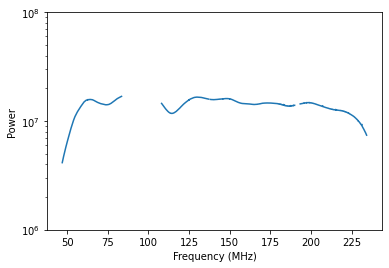

In [100]:
#getting expected bandpass

good_curves = [uv.get_data((0,0, uv.polarization_array[0])),
               uv.get_data((1,1, uv.polarization_array[0])),
               uv.get_data((13,13, uv.polarization_array[0])),
               uv.get_data((14,14, uv.polarization_array[0])),
               uv.get_data((23,23, uv.polarization_array[0])),
               uv.get_data((25,25, uv.polarization_array[0])),
               uv.get_data((39,39, uv.polarization_array[0])),
              ]
good_curves = np.asarray(good_curves)
print(good_curves.shape)
average_curve= np.abs(np.average(good_curves,0))
print(average_curve.shape)
average_curve = mask(average_curve)
plt.plot(freq,average_curve[0])
plt.yscale('log')
plt.ylim((1e6,1e8))
plt.xlabel('Frequency (MHz)')
plt.ylabel('Power')


In [21]:
#returns the array for the expected bandpass

def expected_bandpass():
    good_curves = [uv.get_data((0,0, uv.polarization_array[0])),
                   uv.get_data((1,1, uv.polarization_array[0])),
                   uv.get_data((13,13, uv.polarization_array[0])),
                   uv.get_data((14,14, uv.polarization_array[0])),
                   uv.get_data((23,23, uv.polarization_array[0])),
                   uv.get_data((25,25, uv.polarization_array[0])),
                   uv.get_data((39,39, uv.polarization_array[0])),
                  ]
    good_curves = np.asarray(good_curves)
    average_curve= np.abs(np.average(good_curves,0))
    expect_band = mask(average_curve)
    return expect_band[0];

In [22]:
print(expected_bandpass().shape)

(1536,)


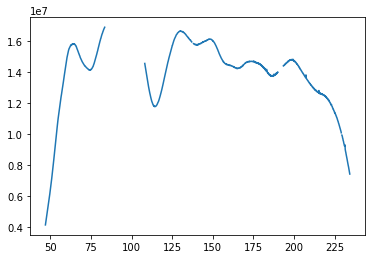

In [23]:
plt.plot(freq,expected_bandpass())

           14            13             12             11
-5.75e-19 x  + 1.09e-15 x  - 9.358e-13 x  + 4.815e-10 x 
              10             9            8          7         6
 - 1.653e-07 x  + 3.991e-05 x - 0.006952 x + 0.8816 x - 81.01 x
         5             4             3            2
 + 5284 x - 2.341e+05 x + 6.401e+06 x - 8.14e+07 x - 3.037e+08 x + 1.497e+10


Text(0, 0.5, 'Power')

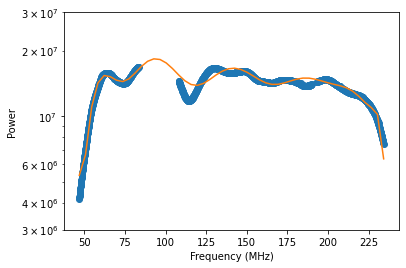

In [131]:
#fitting the curve

x = freq
y = average_curve[0]

#calculates polynomial
fit = np.polyfit(x,y,14)
f = np.poly1d(fit)
print(f)

# calculate new x's and y's
x_new = np.linspace(x[0], x[-1], 50)
y_new = f(x_new)

#plot
plt.plot(x,y,'o', x_new, y_new)
plt.yscale('log')
plt.ylim((3e6,3e7))
plt.xlabel('Frequency (MHz)')
plt.ylabel('Power')

In [146]:
def fourteenth_degree_poly(x, fourteen, thirteen, twelve, eleven, ten, nine, 
                           eight, seven, six, five, four, three, two, one, zero):
    return (fourteen*x**(14)+ thirteen*x**(13)+ twelve*x**(12)+ eleven*x**(11)+ ten*x**(10)+ 
nine*x**(9)+ eight*x**(8)+ seven*x**(7)+ six*x**(6)+ five*x**(5)+ four*x**(4)+ three*x**(3)+ 
two*x**(2)+ one*x+ zero);
